# Comparison tf.data and Hub

Author: Margaux Masson-Forsythe

In [ ]:
!nvidia-smi

Fri Aug 20 22:39:53 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.57.02    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P0    28W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Imports 

In [ ]:
!pip install hub==2.0.7

In [ ]:
import hub 
import tensorflow as tf
import pathlib
import os
import matplotlib.pyplot as plt
# import pandas as pd
import numpy as np
from PIL import Image
from tqdm import tqdm

np.set_printoptions(precision=4)

In [ ]:
print(hub.__version__)
print(tf.__version__)

2.0.7
2.6.0


## Load [cifar10 Dataset](https://www.cs.toronto.edu/~kriz/cifar.html)

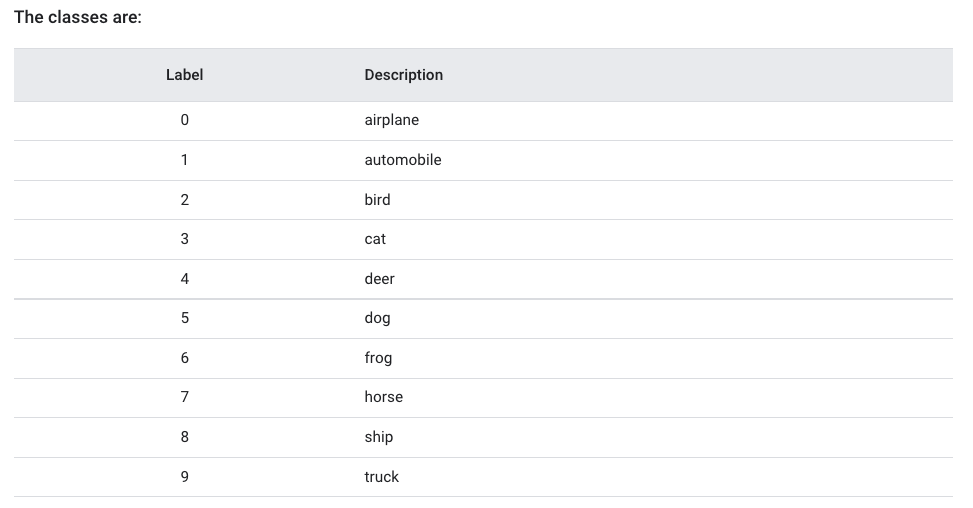

### tf.data

In [ ]:
train, test = tf.keras.datasets.cifar10.load_data()

170508288/170498071 [==============================] - 11s 0us/step


In [ ]:
images, labels = train
images = images/255 # normalize

dataset_cifar10_tf_data = tf.data.Dataset.from_tensor_slices((images, labels))
dataset_cifar10_tf_data

<TensorSliceDataset shapes: ((32, 32, 3), (1,)), types: (tf.float64, tf.uint8)>

### Hub

In [ ]:
ds_cifar10_hub = hub.load('hub://activeloop/cifar10-train')

Opening dataset in read-only mode as you don't have write permissions.


In [ ]:
ds_cifar10_hub

Dataset(path='hub://activeloop/cifar10-train', read_only=True, tensors=['images', 'labels'])

In [ ]:
def to_model_fit(item):
    x = item['images']/255 # normalize
    y = item['labels']
    return (x, y)


ds_cifar10_hub_tf = ds_cifar10_hub.tensorflow()
ds_cifar10_hub_tf = ds_cifar10_hub_tf.map(lambda x: to_model_fit(x))
ds_cifar10_hub_tf

<MapDataset shapes: ((32, 32, 3), (1,)), types: (tf.float32, tf.uint32)>

## Batching and shuffling dataset

In [ ]:
batch_size = 10

# shuffling on the entire dataset
shuffle_buffer = len(ds_cifar10_hub) 

In [ ]:
def visualize_img_label_in_first_batch_TF_ds(ds, batch_size):
  for image, label in ds:
    for b in range(batch_size):
      print(f'Image size: {image.numpy()[b].shape}')
      print(label.numpy()[b])
      plt.imshow(image.numpy()[b])
      plt.show()
    break

### tf.data

In [ ]:
dataset_cifar10_tf_data_shuffled_batched = dataset_cifar10_tf_data.shuffle(shuffle_buffer).batch(batch_size)

Image size: (32, 32, 3)
[4]


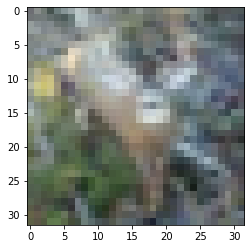

Image size: (32, 32, 3)
[9]


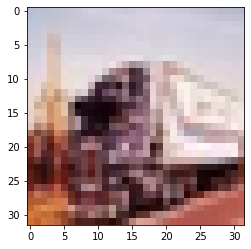

Image size: (32, 32, 3)
[3]


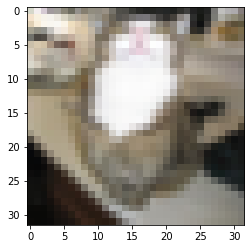

Image size: (32, 32, 3)
[5]


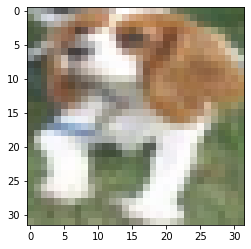

Image size: (32, 32, 3)
[8]


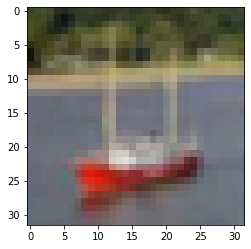

Image size: (32, 32, 3)
[8]


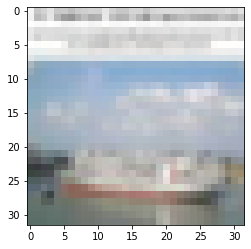

Image size: (32, 32, 3)
[8]


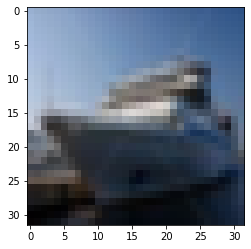

Image size: (32, 32, 3)
[5]


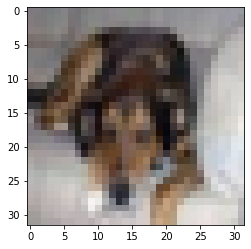

Image size: (32, 32, 3)
[6]


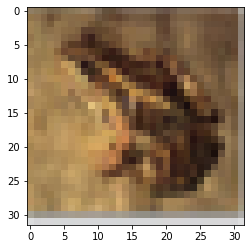

Image size: (32, 32, 3)
[3]


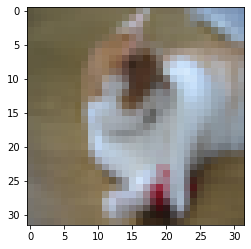

In [ ]:
# Visualize first batch in dataset_cifar10_tf_data_shuffled_batched
visualize_img_label_in_first_batch_TF_ds(dataset_cifar10_tf_data_shuffled_batched, batch_size)

### Hub

In [ ]:
ds_cifar10_hub_tf_shuffled_batched = ds_cifar10_hub_tf.shuffle(shuffle_buffer).batch(batch_size)

Image size: (32, 32, 3)
[1]


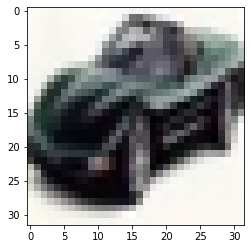

Image size: (32, 32, 3)
[3]


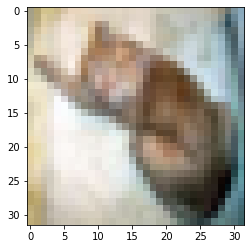

Image size: (32, 32, 3)
[5]


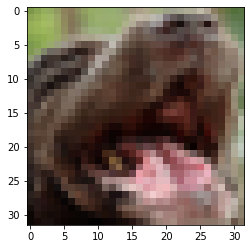

Image size: (32, 32, 3)
[7]


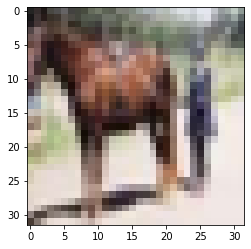

Image size: (32, 32, 3)
[5]


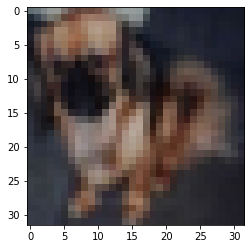

Image size: (32, 32, 3)
[3]


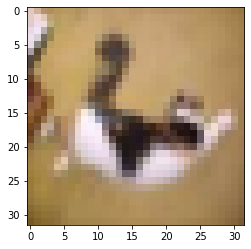

Image size: (32, 32, 3)
[5]


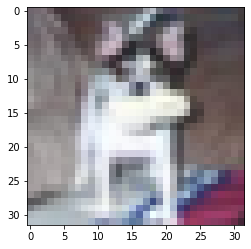

Image size: (32, 32, 3)
[8]


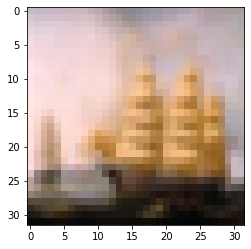

Image size: (32, 32, 3)
[6]


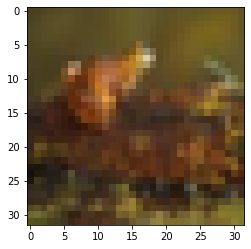

Image size: (32, 32, 3)
[8]


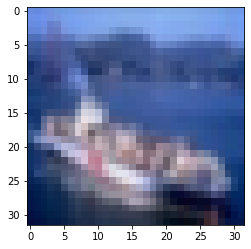

In [ ]:
# Visualize first batch in ds_cifar10_hub_tf_shuffled_batched
visualize_img_label_in_first_batch_TF_ds(ds_cifar10_hub_tf_shuffled_batched, batch_size)

## Preprocessing: Resize CIRFAR10 dataset from (32, 32, 3) to (20, 20, 3)

### tf.data

In [ ]:
# Resize image to the size passed as input and return resized image and label
def resize_image(img, label, size):
  image = tf.image.resize(img, size)
  return image, label

(20, 20, 3)
[6]


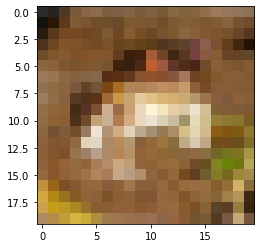

(20, 20, 3)
[9]


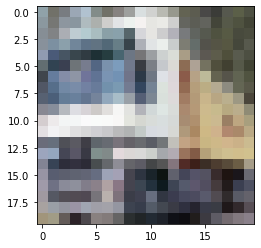

(20, 20, 3)
[9]


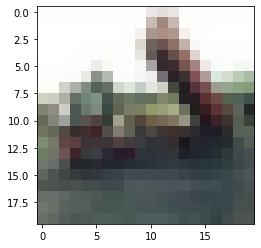

(20, 20, 3)
[4]


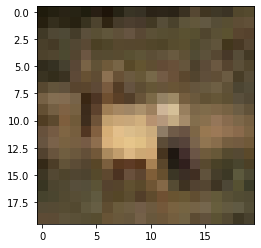

In [ ]:
images_ds = dataset_cifar10_tf_data.map((lambda x, y: tf.py_function(resize_image, [x,y, [20,20]], (tf.float32, tf.uint8))), num_parallel_calls=2)

for image, label in images_ds.take(4):
  print(image.shape)
  print(label.numpy())
  plt.imshow(image)
  plt.show()

### Hub

In [ ]:
@hub.compute
def resize(sample_in, sample_out, new_size):    
    # Append the label and image to the output sample
    sample_out.labels.append(sample_in.labels.numpy())
    sample_out.images.append(np.array(Image.fromarray(sample_in.images.numpy()).resize(new_size)))
    
    return sample_out

In [ ]:
# Hub path of new resized dataset -- this could be any path format (local, s3, etc)
path_dataset_resized = './cifar10-dataset-resized-10x10'

# We use the overwrite=True to make this code re-runnable
ds_cifar10_hub_resized = hub.like(path_dataset_resized, ds_cifar10_hub, overwrite = True)

resize(new_size=(20, 20)).eval(ds_cifar10_hub, ds_cifar10_hub_resized, num_workers = 2)

In [ ]:
def visualize_first_N_img_label_in_hub_ds(ds, number_images):
  N = 0
  for item in ds:
    if N <= number_images:
      print(f'Image size: {item.images.numpy().shape}')
      print(item.labels.numpy())
      plt.imshow(item.images.numpy())
      plt.show()
      N += 1
    else:
      break

Image size: (32, 32, 3)
[6]


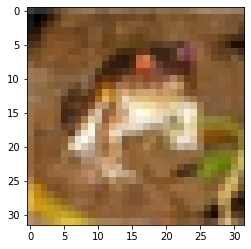

Image size: (32, 32, 3)
[9]


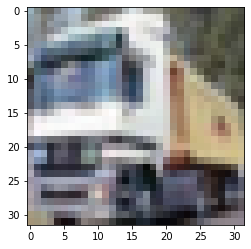

Image size: (32, 32, 3)
[9]


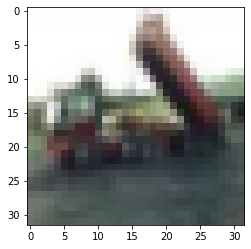

Image size: (32, 32, 3)
[4]


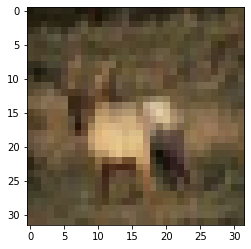

Image size: (32, 32, 3)
[1]


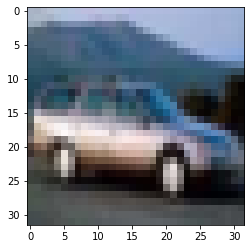

In [ ]:
# Visualize first 4 images in ds_cifar10
visualize_first_N_img_label_in_hub_ds(ds_cifar10_hub, 4)

Image size: (20, 20, 3)
[6]


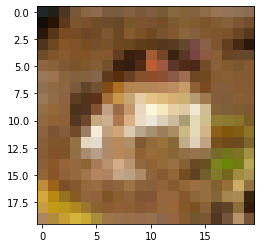

Image size: (20, 20, 3)
[9]


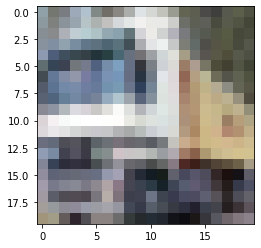

Image size: (20, 20, 3)
[9]


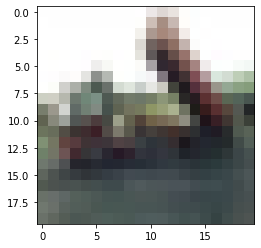

Image size: (20, 20, 3)
[4]


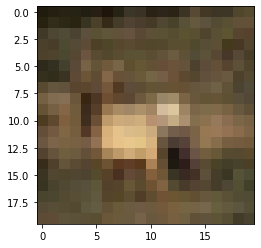

Image size: (20, 20, 3)
[1]


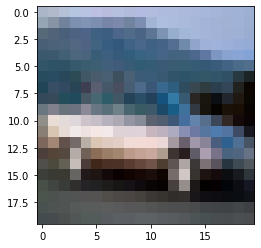

In [ ]:
# Visualize first 4 images in ds_cifar10_resized
visualize_first_N_img_label_in_hub_ds(ds_cifar10_hub_resized, 4)

## Create dataset from directory: [Flower dataset](https://www.kaggle.com/batoolabbas91/flower-photos-by-the-tensorflow-team) 

### Download dataset

In [ ]:
!export KAGGLE_USERNAME="xxxxxx" && export KAGGLE_KEY="xxxxxxxxx" && kaggle datasets download -d batoolabbas91/flower-photos-by-the-tensorflow-team && unzip -n flower-photos-by-the-tensorflow-team.zip

flower-photos-by-the-tensorflow-team.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  flower-photos-by-the-tensorflow-team.zip


In [ ]:
!ls flower_photos

daisy  dandelion  LICENSE.txt  roses  sunflowers  tulips


In [ ]:
dataset_flowers_path = 'flower_photos'

from imutils import paths
files_list = sorted(list(paths.list_images(dataset_flowers_path)))
classes_flowers = sorted(os.listdir(dataset_flowers_path))

print(f'There are {len(classes_flowers)} classes of flowers in the dataset" {classes_flowers}')

There are 6 classes of flowers in the dataset" ['LICENSE.txt', 'daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']


In [ ]:
# Removing the 'LICENSE.txt'
classes_flowers.remove('LICENSE.txt')
print(f'There are {len(classes_flowers)} classes of flowers in the dataset" {classes_flowers}')

There are 5 classes of flowers in the dataset" ['daisy', 'dandelion', 'roses', 'sunflowers', 'tulips']


(320, 263)


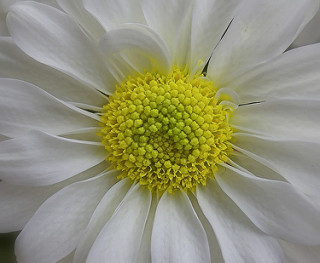

(500, 313)


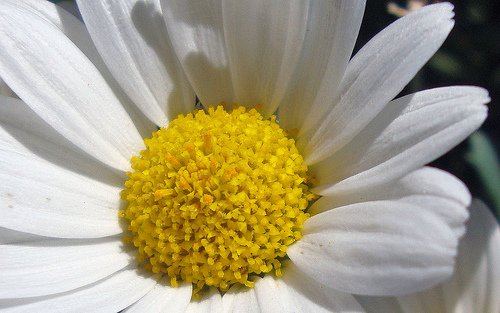

(320, 215)


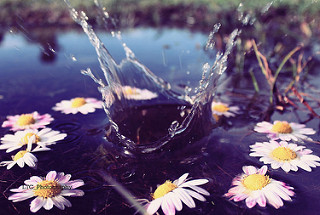

(500, 333)


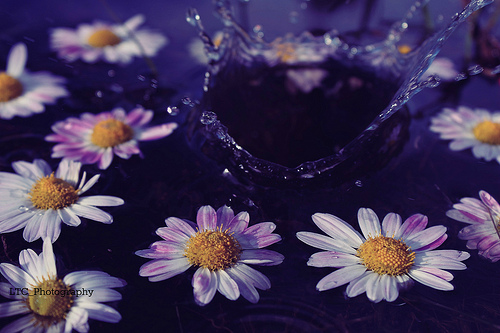

In [ ]:
for i in range(4):
  image = Image.open(files_list[i])
  image_size = image.size
  print(image_size)
  image.show()

The images all have different sizes

### Common variables and functions

In [ ]:
def train_with_simple_CNN_function(ds):
  model = tf.keras.Sequential([
      tf.keras.layers.InputLayer(input_shape=(resize_size[0], resize_size[1], 3)),
      tf.keras.layers.Conv2D(16,3,padding='same',activation='relu'),
      tf.keras.layers.MaxPooling2D(),
      tf.keras.layers.Conv2D(32,3,padding='same',activation='relu'),
      tf.keras.layers.MaxPooling2D(),
      tf.keras.layers.Conv2D(64,3,padding='same',activation='relu'),
      tf.keras.layers.MaxPooling2D(),
      # tf.keras.layers.Dropout(0.2),
      tf.keras.layers.Flatten(),
      tf.keras.layers.Dense(128,activation='relu'),
     tf.keras. layers.Dense(len(classes_flowers), activation='softmax')
  ])

  # Compile the model, we are using the Adam optimizer, the SparseCategoricalCrossentropy loss
  # and SparseCategoricalAccuracy because our labels are 
  # not categorical 
  model.compile(
      optimizer='adam',
      loss=tf.keras.losses.SparseCategoricalCrossentropy(),
      metrics=[tf.keras.metrics.SparseCategoricalAccuracy()]
  )

  # Start training over 2 epoch
  history = model.fit(ds, epochs = 2, shuffle=False)

In [ ]:
resize_size = (256, 256)

# We use the same seed to shuffle both the tf.data and Hub datasets so 
# that we can efficiently compare them
shuffle_common_seed = 21

batch_size = 10

### tf.data:

In [ ]:
def parse_image(file_name):
	# read the image, decode it, resize it, and normalize it
  image = tf.io.read_file(file_name)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.resize(image, resize_size) / 255.0
  # Found the label and encode it
  label = tf.strings.split(file_name, os.path.sep)[-2]
  one_hot = label == classes_flowers
  encoded_label = tf.argmax(one_hot)
  # return the image and the integer encoded label
  return (image, encoded_label)
 
ds_flowers_tf_data = tf.data.Dataset.from_tensor_slices(files_list)
ds_flowers_tf_data = (ds_flowers_tf_data
                      # Calling parse_image
                      .map(parse_image, num_parallel_calls=tf.data.AUTOTUNE)
                      .batch(batch_size)
                      .shuffle(len(ds_flowers_tf_data), seed=shuffle_common_seed)
                      .prefetch(tf.data.AUTOTUNE))
ds_flowers_tf_data

<PrefetchDataset shapes: ((None, 256, 256, 3), (None,)), types: (tf.float32, tf.int64)>

Image size: (256, 256, 3)
0


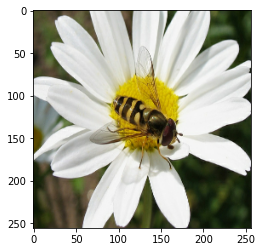

Image size: (256, 256, 3)
0


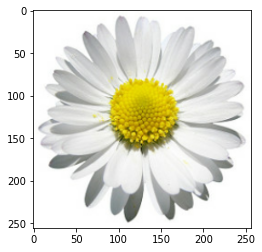

Image size: (256, 256, 3)
0


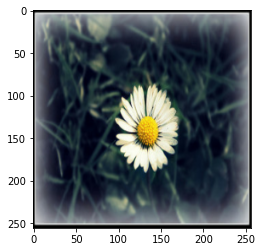

Image size: (256, 256, 3)
0


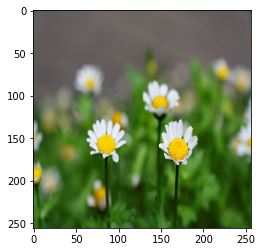

Image size: (256, 256, 3)
0


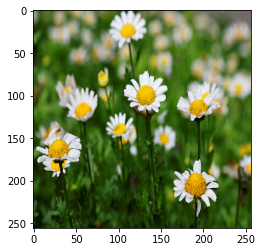

Image size: (256, 256, 3)
0


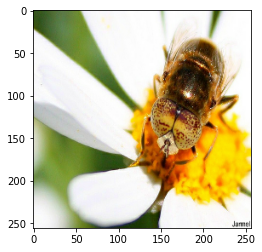

Image size: (256, 256, 3)
0


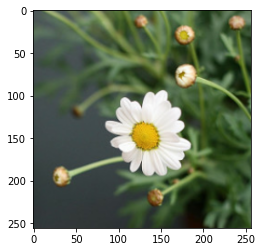

Image size: (256, 256, 3)
0


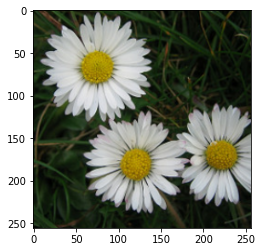

Image size: (256, 256, 3)
0


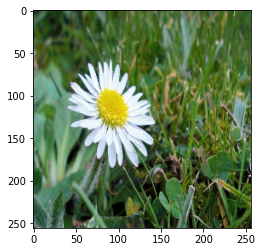

Image size: (256, 256, 3)
0


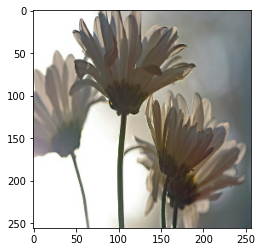

In [ ]:
visualize_img_label_in_first_batch_TF_ds(ds_flowers_tf_data, batch_size)

In [ ]:
train_with_simple_CNN_function(ds_flowers_tf_data)

Epoch 1/2
367/367 [==============================] - 8s 8ms/step - loss: 1.6173 - sparse_categorical_accuracy: 0.3248
Epoch 2/2
367/367 [==============================] - 7s 8ms/step - loss: 1.3686 - sparse_categorical_accuracy: 0.4270


### Hub: https://docs.activeloop.ai/getting-started/creating-datasets-manually

In [ ]:
with hub.empty('./flowers_hub') as ds_flowers_hub:
    # Create the tensors with names of your choice.
    ds_flowers_hub.create_tensor('images', htype = 'image', sample_compression = 'jpg')
    ds_flowers_hub.create_tensor('labels', htype = 'class_label', class_names = classes_flowers)
    
    # Iterate through the files and append to hub dataset
    for file in tqdm(files_list):
        label_text = os.path.basename(os.path.dirname(file))
        label_num = classes_flowers.index(label_text)
        
        ds_flowers_hub.images.append(hub.read(file))  # Append to images tensor using hub.read
        ds_flowers_hub.labels.append(np.uint32(label_num)) # Append to labels tensor
                

100%|██████████| 3670/3670 [00:15<00:00, 230.08it/s]


Resize

In [ ]:
@hub.compute
def resize(sample_in, sample_out, new_size):    
    # Append the label and image to the output sample
    sample_out.labels.append(sample_in.labels.numpy())
    sample_out.images.append(np.array(Image.fromarray(sample_in.images.numpy()).resize(new_size)))
    
    return sample_out
    
# Hub path of new resized dataset -- this could be any path format (hub, s3, etc)
path_dataset_resized = './flowers-dataset-resized-256x256'

# We use the overwrite=True to make this code re-runnable
ds_flowers_hub_resized = hub.like(path_dataset_resized, ds_flowers_hub, overwrite = True)

resize(new_size=resize_size).eval(ds_flowers_hub, ds_flowers_hub_resized, num_workers = 2)

Convert to Tensorflow

In [ ]:
def to_model_fit(item):
    x = item['images']/255 # normalize
    y = item['labels']
    return (x, y)

ds_flowers_hub_tf = ds_flowers_hub_resized.tensorflow()

ds_flowers_hub_tf =  (ds_flowers_hub_tf
                      # calling to_model_fit
                      .map(lambda x: to_model_fit(x))
                      .batch(batch_size)
                      .shuffle(len(ds_flowers_hub_resized), seed=shuffle_common_seed)
                      .prefetch(tf.data.AUTOTUNE))

Image size: (256, 256, 3)
[0]


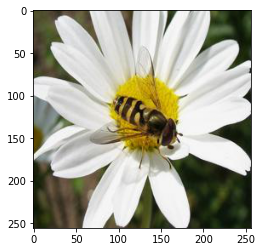

Image size: (256, 256, 3)
[0]


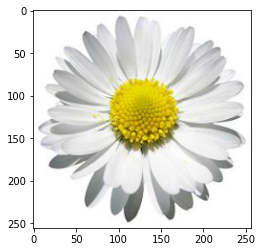

Image size: (256, 256, 3)
[0]


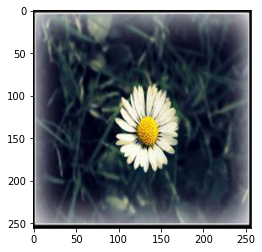

Image size: (256, 256, 3)
[0]


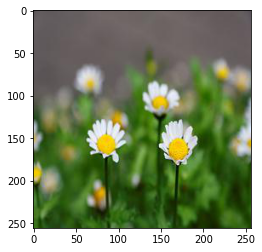

Image size: (256, 256, 3)
[0]


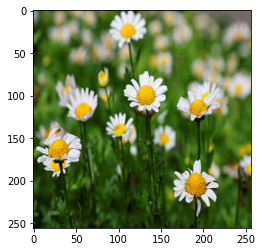

Image size: (256, 256, 3)
[0]


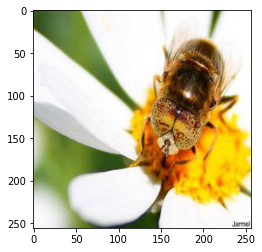

Image size: (256, 256, 3)
[0]


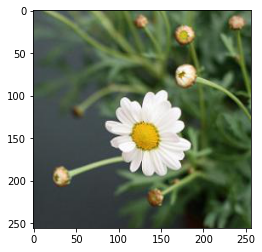

Image size: (256, 256, 3)
[0]


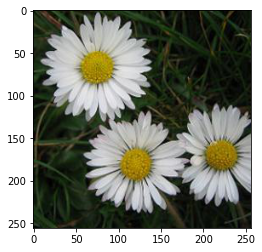

Image size: (256, 256, 3)
[0]


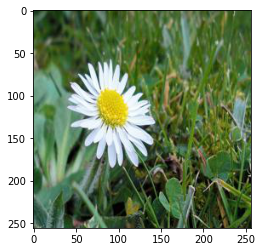

Image size: (256, 256, 3)
[0]


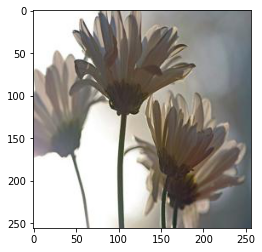

In [ ]:
visualize_img_label_in_first_batch_TF_ds(ds_flowers_hub_tf, batch_size)

In [ ]:
train_with_simple_CNN_function(ds_flowers_hub_tf)

Epoch 1/2
918/918 [==============================] - 38s 17ms/step - loss: 1.4813 - sparse_categorical_accuracy: 0.3948
Epoch 2/2
918/918 [==============================] - 37s 17ms/step - loss: 1.1505 - sparse_categorical_accuracy: 0.5390


## Data augmentation

### tf.data

In [ ]:
def augment_using_ops(images, labels):
	images = tf.image.random_flip_left_right(images)
	images = tf.image.random_flip_up_down(images)
	images = tf.image.rot90(images)
	return (images, labels)
 

ds_flowers_tf_data = tf.data.Dataset.from_tensor_slices(files_list)
 
# We shuffle, cachhe, batched, augment and prefetch 
ds_directory_tf_data_data_aug = (ds_flowers_tf_data
                  .map(parse_image, num_parallel_calls=tf.data.AUTOTUNE)
                  .shuffle(len(ds_flowers_tf_data), seed=shuffle_common_seed)
                  .cache()
                  .batch(batch_size)
                  .map(augment_using_ops, num_parallel_calls=tf.data.AUTOTUNE)
                  .prefetch(tf.data.AUTOTUNE)
)

Image size: (256, 256, 3)
3


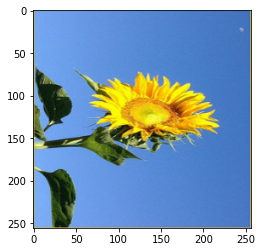

Image size: (256, 256, 3)
0


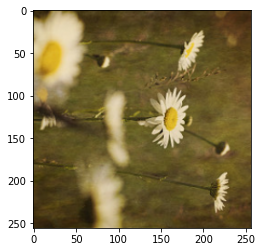

Image size: (256, 256, 3)
1


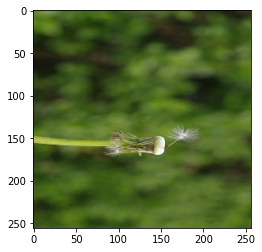

Image size: (256, 256, 3)
0


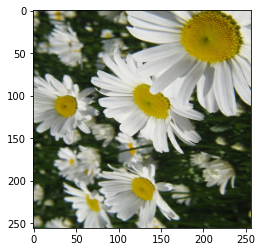

Image size: (256, 256, 3)
0


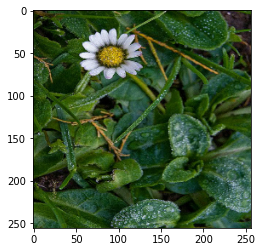

Image size: (256, 256, 3)
0


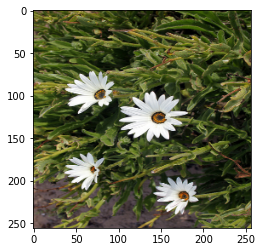

Image size: (256, 256, 3)
0


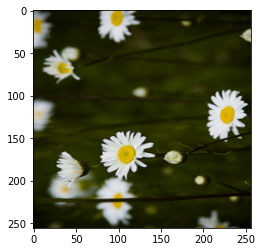

Image size: (256, 256, 3)
4


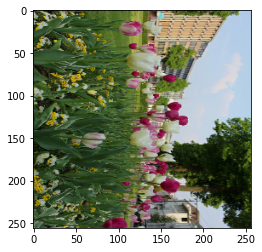

Image size: (256, 256, 3)
0


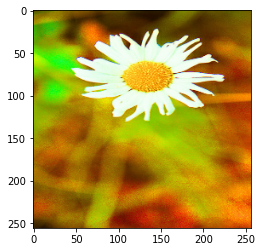

Image size: (256, 256, 3)
2


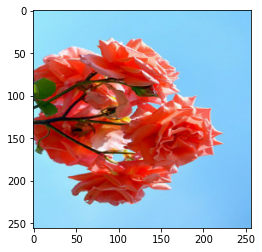

In [ ]:
visualize_img_label_in_first_batch_TF_ds(ds_directory_tf_data_data_aug, batch_size)

### Hub

In [ ]:
def normalize_and_augment(item):
    x = item['images']/255 # normalize
    x = tf.image.random_flip_left_right(x)
    x = tf.image.random_flip_up_down(x)
    x = tf.image.rot90(x)
    y = item['labels']
    return (x, y)
 

ds_flowers_hub_tf = ds_flowers_hub_resized.tensorflow()

# We shuffle, cachhe, batched, augment and prefetch 
ds_flowers_hub_data_aug = (ds_flowers_hub_tf
                  .shuffle(len(ds_flowers_tf_data), seed=shuffle_common_seed)
                  .cache()
                  .batch(batch_size)
                  .map(normalize_and_augment, num_parallel_calls=tf.data.AUTOTUNE)
                  .prefetch(tf.data.AUTOTUNE)
)

Image size: (256, 256, 3)
[3]


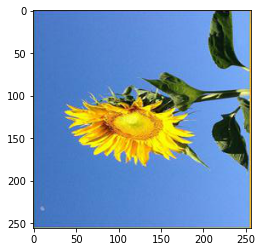

Image size: (256, 256, 3)
[0]


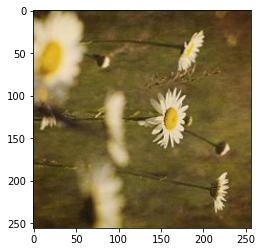

Image size: (256, 256, 3)
[1]


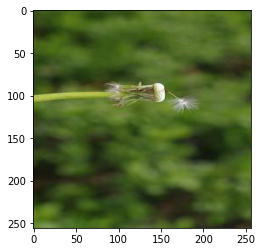

Image size: (256, 256, 3)
[0]


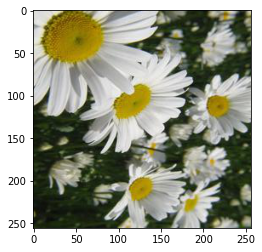

Image size: (256, 256, 3)
[0]


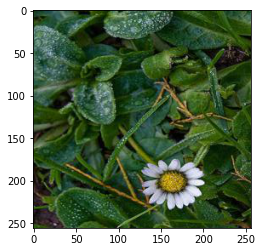

Image size: (256, 256, 3)
[0]


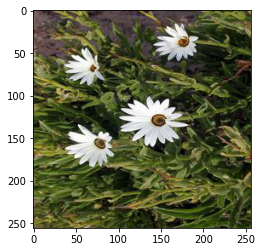

Image size: (256, 256, 3)
[0]


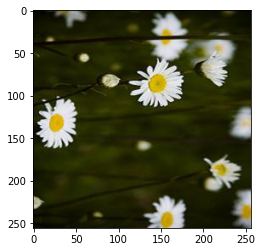

Image size: (256, 256, 3)
[4]


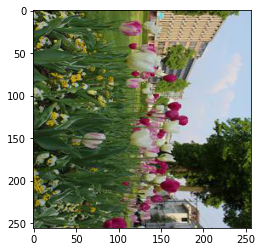

Image size: (256, 256, 3)
[0]


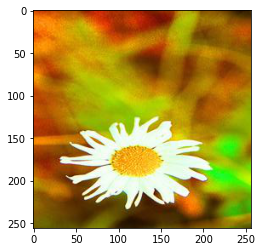

Image size: (256, 256, 3)
[2]


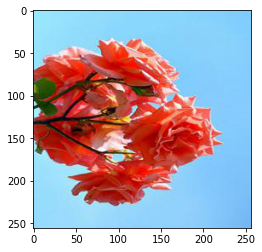

In [ ]:
visualize_img_label_in_first_batch_TF_ds(ds_flowers_hub_data_aug, batch_size)

## Segmentation Dataset: Image + Mask

### Download dataset

In [ ]:
!export KAGGLE_USERNAME="xxxxxx" && export KAGGLE_KEY="xxxxxxxxxx" && kaggle datasets download -d metavision/accurate-damaged-flower-shapessegmentation && unzip -n accurate-damaged-flower-shapessegmentation.zip

Streaming output truncated to the last 5000 lines.
  inflating: 05-damaged-01/720p/image00000098.jpg  
  inflating: 05-damaged-01/720p/image00000099.jpg  
  inflating: 05-damaged-01/720p/image00000100.jpg  
  inflating: 05-damaged-01/720p/image00000101.jpg  
  inflating: 05-damaged-01/720p/image00000102.jpg  
  inflating: 05-damaged-01/720p/image00000103.jpg  
  inflating: 05-damaged-01/720p/image00000104.jpg  
  inflating: 05-damaged-01/720p/image00000105.jpg  
  inflating: 05-damaged-01/720p/image00000106.jpg  
  inflating: 05-damaged-01/720p/image00000107.jpg  
  inflating: 05-damaged-01/720p/image00000108.jpg  
  inflating: 05-damaged-01/720p/image00000109.jpg  
  inflating: 05-damaged-01/720p/image00000110.jpg  
  inflating: 05-damaged-01/720p/image00000111.jpg  
  inflating: 05-damaged-01/720p/image00000112.jpg  
  inflating: 05-damaged-01/720p/image00000113.jpg  
  inflating: 05-damaged-01/720p/image00000114.jpg  
  inflating: 05-damaged-01/720p/image00000115.jpg  
  inflating: 

In [ ]:
!ls 05-damaged-01

720p  index-sample.png	mask  overview.mp4  readme.txt	sample-4k


In [ ]:
dataset_flowers_damaged_seg_path = '05-damaged-01'

from imutils import paths
files_list_flowers_images = sorted(list(paths.list_images(dataset_flowers_damaged_seg_path + '/720p')))
files_list_flowers_masks = sorted(list(paths.list_images(dataset_flowers_damaged_seg_path + '/mask')))

print(f'There are {len(files_list_flowers_images)} image/mask pairs in this dataset')

There are 2544 image/mask pairs in this dataset


In [ ]:
# Making sure we have as many images as we have masks
assert len(files_list_flowers_masks)==len(files_list_flowers_images)

Displaying images and their size

(1280, 720)


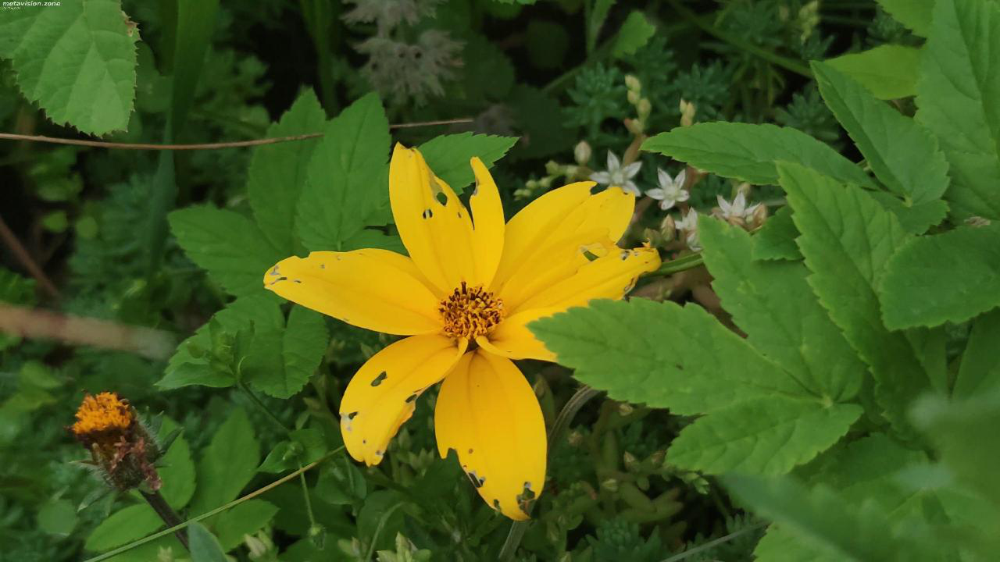

(1280, 720)


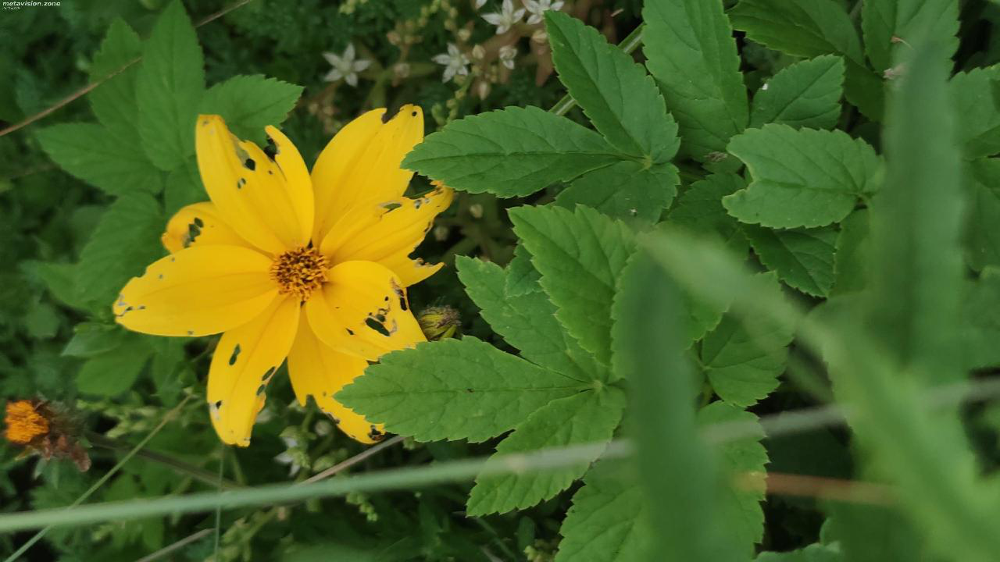

(1280, 720)


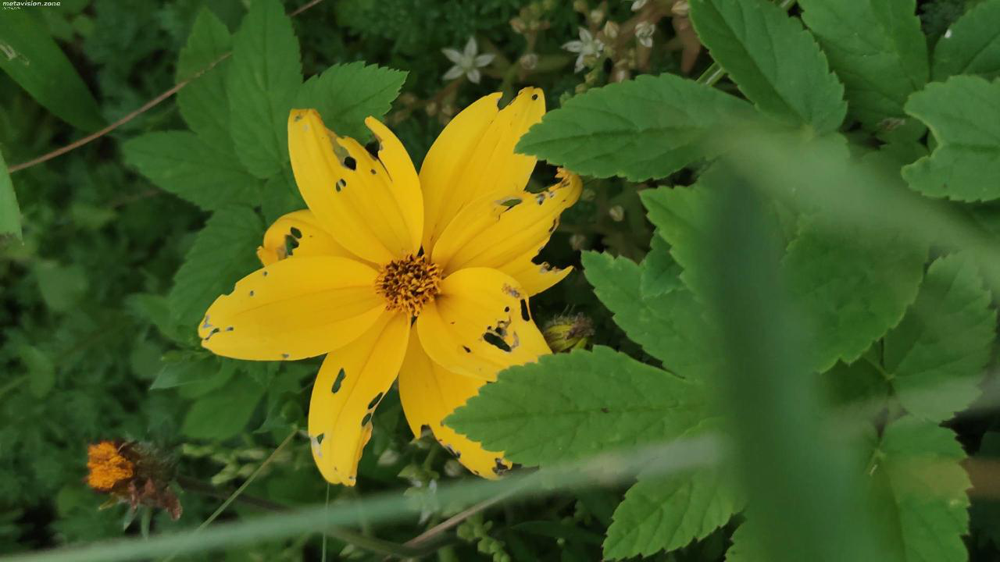

(1280, 720)


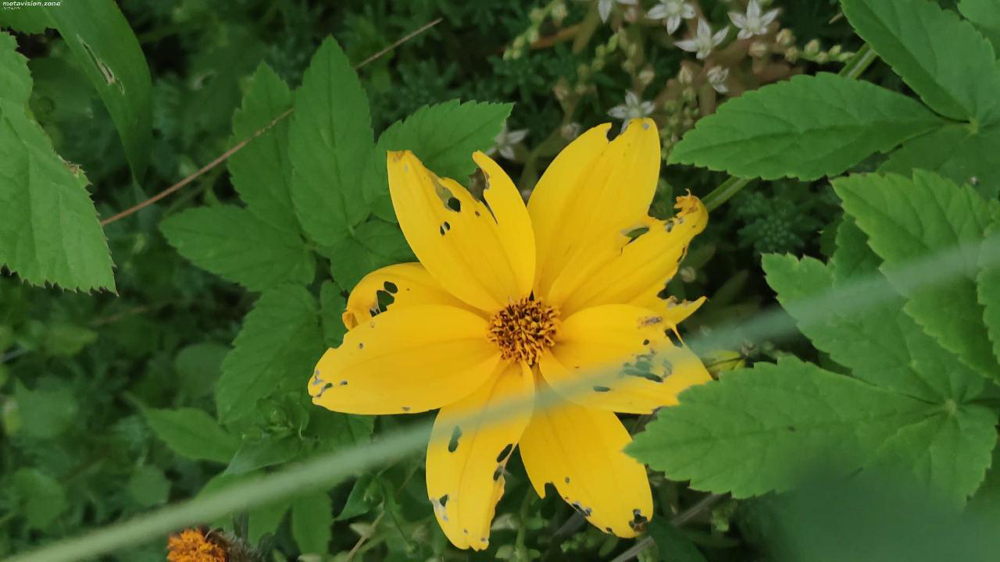

In [ ]:
for i in range(4):
  img = Image.open(files_list_flowers_images[i])
  print(img.size)
  img.show()

Displaying images' masks and their size

(1280, 720)


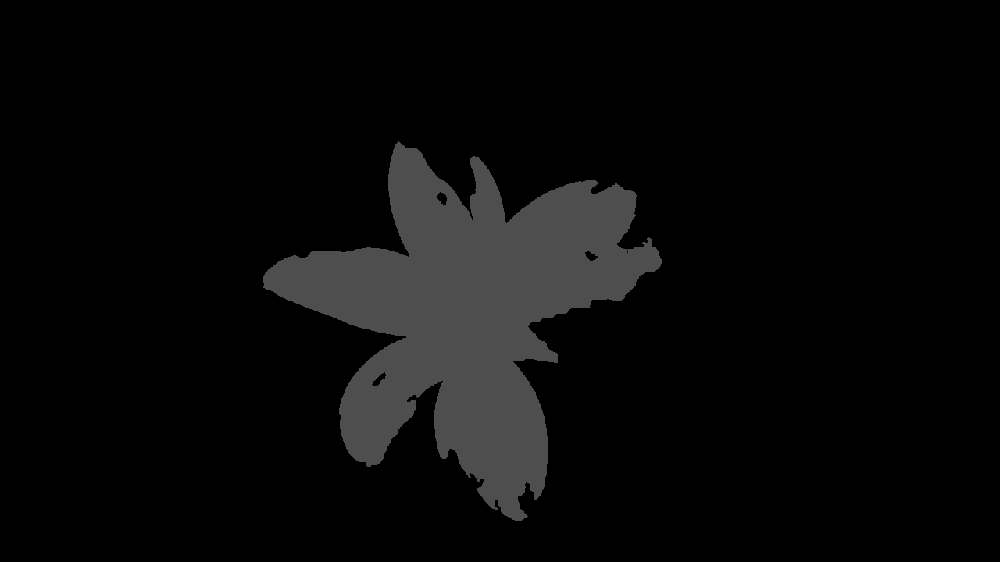

[ 0 20 74 77 78]
(1280, 720)


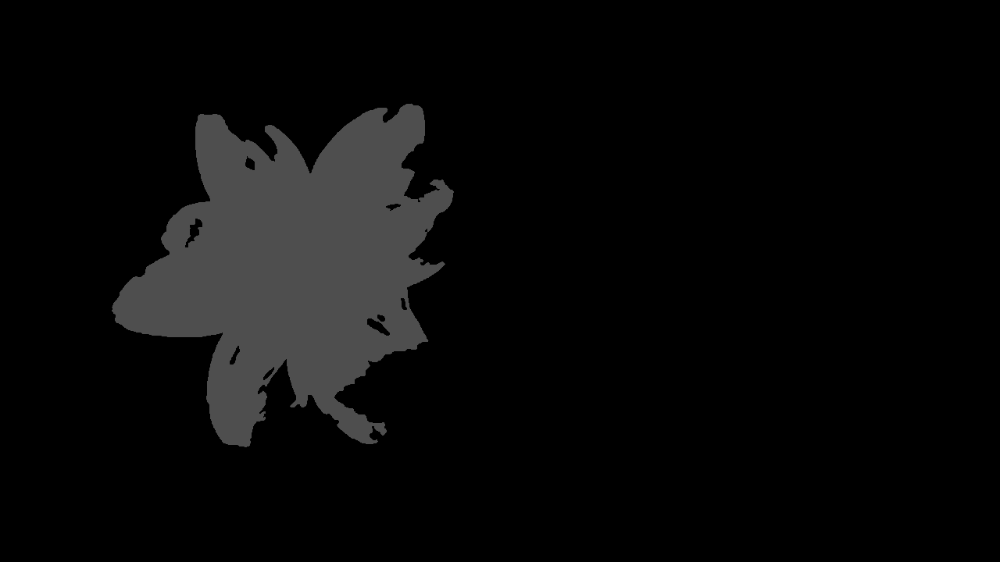

[ 0 20 77 78]
(1280, 720)


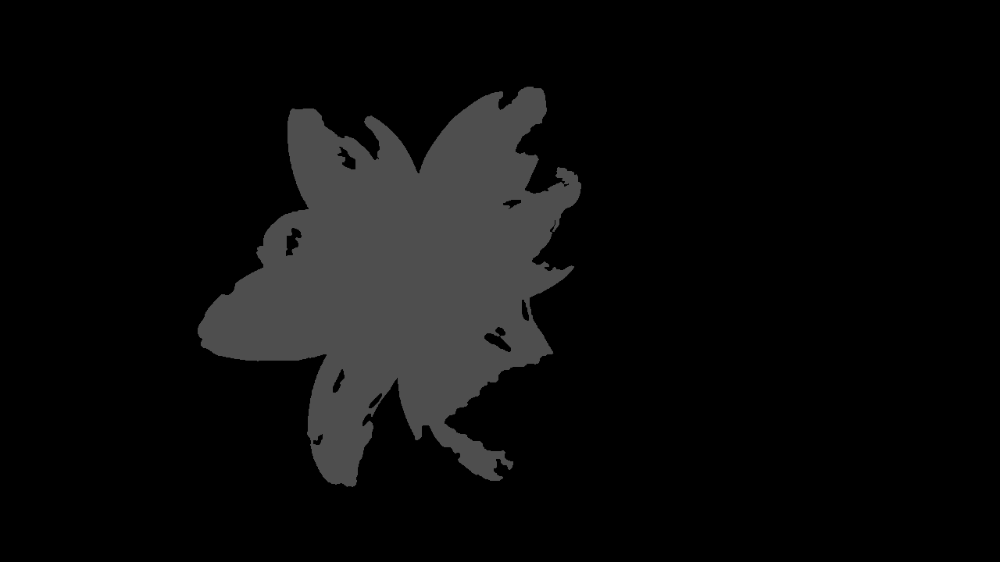

[ 0 20 74 77 78]
(1280, 720)


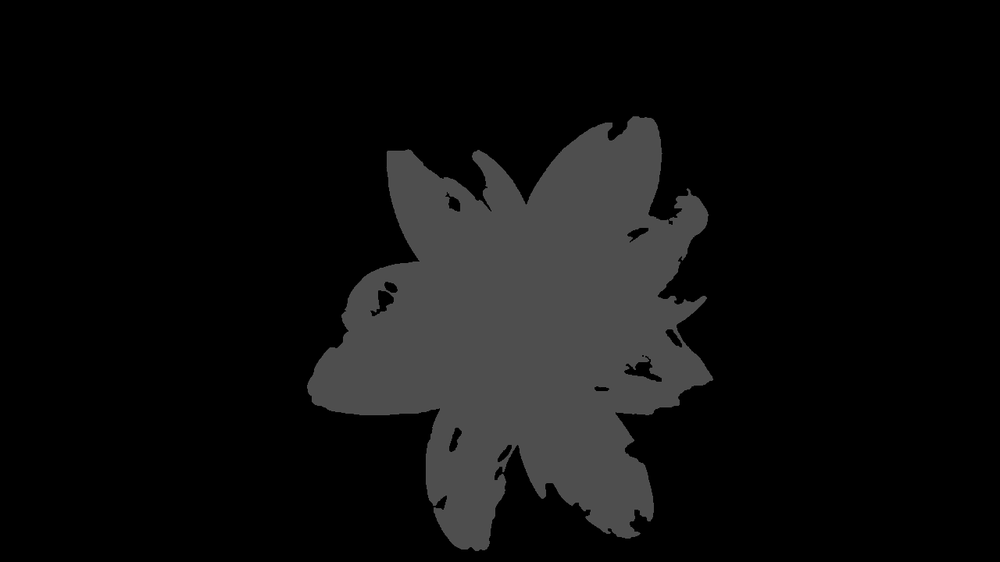

[ 0 20 74 77 78]


In [ ]:
for i in range(4):
  mask = Image.open(files_list_flowers_masks[i]).convert('L')
  print(mask.size)
  mask.show()
  print(np.unique(mask))

### tf.data

In [ ]:
resize_size = (512, 512)
batch_size = 4
shuffle_common_seed = 21

In [ ]:
def parse_image_mask(image_name, mask_name):
	# read the image, decode it, resize it, and normalize it
  image = tf.io.read_file(image_name)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.resize(image, resize_size) / 255.0
  
  # read the image, decode it
  mask = tf.io.read_file(mask_name)
  mask = tf.image.decode_jpeg(mask, channels=1)

  # Need to have binary values: 0 or 1
  mask = tf.cast(mask > 0, tf.int32)

  # Resize
  mask = tf.image.resize(mask, resize_size, method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  # return the image and its mask
  return (image, mask)
 
ds_flowers_tf_data_seg = tf.data.Dataset.from_tensor_slices((files_list_flowers_images, files_list_flowers_masks))
ds_flowers_tf_data_seg = (ds_flowers_tf_data_seg
                        # Calling parse_image
                        .map(parse_image_mask, num_parallel_calls=tf.data.AUTOTUNE)
                        .batch(batch_size)
                        .shuffle(len(ds_flowers_tf_data_seg), seed=shuffle_common_seed)
                        .prefetch(tf.data.AUTOTUNE))
ds_flowers_tf_data_seg

<PrefetchDataset shapes: ((None, 512, 512, 3), (None, 512, 512, 1)), types: (tf.float32, tf.int32)>

In [ ]:
def show_img_mask_in_first_batch(ds, batch_size):
  for image, mask in ds:
    # first batch
    for b in range(batch_size):
      print(image.numpy()[b].shape)
      plt.imshow(image.numpy()[b])
      plt.show()
      print(mask.numpy()[b].shape)
      plt.imshow(mask.numpy()[b][:,:,0])
      plt.show()
      print(np.unique(mask.numpy()[b][:,:,0])) # we want [0. 1.]
    break

(512, 512, 3)


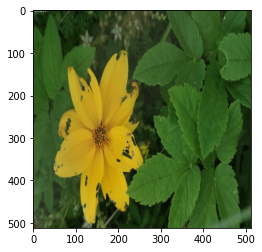

(512, 512, 1)


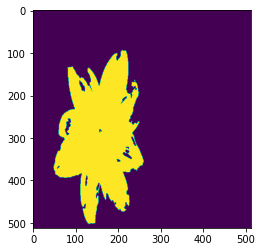

[0 1]
(512, 512, 3)


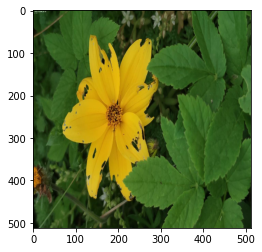

(512, 512, 1)


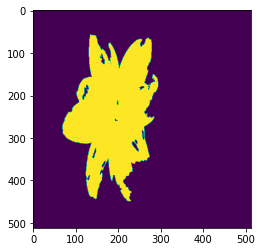

[0 1]
(512, 512, 3)


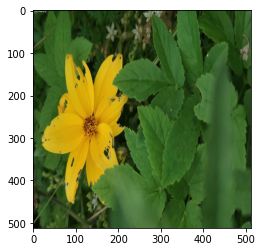

(512, 512, 1)


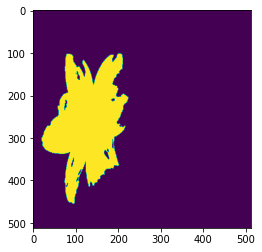

[0 1]
(512, 512, 3)


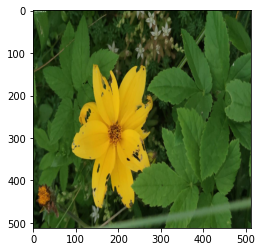

(512, 512, 1)


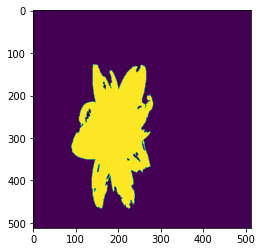

[0 1]


In [ ]:
show_img_mask_in_first_batch(ds_flowers_tf_data_seg, batch_size)

In [ ]:
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
# Model from the Cloud segmentation article
def unet(pretrained_weights=None, input_shape=(256, 256, 1)):
    inputs = Input(input_shape)
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(inputs)
    conv1 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv1)

    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv2)

    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv3)

    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool3)
    conv4 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv4)

    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(pool4)
    conv5 = Conv2D(1024, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv5)
    drop5 = Dropout(0.5)(conv5)

    up6 = Conv2D(512, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(drop5))
    merge6 = concatenate([drop4,up6], axis = 3)
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge6)
    conv6 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv6)

    up7 = Conv2D(256, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv6))
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge7)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv7)

    up8 = Conv2D(128, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv7))
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge8)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(conv8)

    up9 = Conv2D(64, 2, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(UpSampling2D(size = (2,2))(conv8))
    merge9 = concatenate([conv1,up9], axis=3)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = 'he_normal')(merge9)

    conv10 = Conv2D(1, 1, activation='sigmoid')(conv9)
    
    model = Model(inputs=inputs, outputs=conv10)

    # model.summary()

    if(pretrained_weights):
        model.load_weights(pretrained_weights)

    return model

In [ ]:
model = unet(input_shape = (512,512,3))
model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss='binary_crossentropy',
              metrics=['accuracy', tf.keras.metrics.Recall(name="recall"), 
                       tf.keras.metrics.Precision(name="precision"), 
                       tf.keras.metrics.MeanIoU(num_classes=2, name='iou')])

In [ ]:
model.fit(ds_flowers_tf_data_seg, epochs=1)

636/636 [==============================] - 365s 513ms/step - loss: 0.0183 - accuracy: 0.9931 - recall: 0.9797 - precision: 0.9745 - iou: 0.4255


### Hub

In [ ]:
with hub.empty('./flowers_seg_hub') as ds_flowers_hub_seg:
    # Create the tensors with names of your choice.
    ds_flowers_hub_seg.create_tensor('images', htype = 'image', sample_compression = 'jpg')
    ds_flowers_hub_seg.create_tensor('masks', htype = 'image', sample_compression = 'png')
    
    # Iterate through the files and append to hub dataset
    for file in tqdm(files_list_flowers_images):
        # Append to images tensor using hub.read
        ds_flowers_hub_seg.images.append(hub.read(file)) 

        path_to_mask = file.replace('image', 'mask').replace('720p','mask').replace('jpg','png')
        # Append to masks tensor using Pillow Image
        ds_flowers_hub_seg.masks.append(np.array(Image.open(path_to_mask))) 
   

100%|██████████| 2544/2544 [02:25<00:00, 17.48it/s]


In [ ]:
def to_model_fit(item):
    x = tf.image.resize(item['images'], resize_size)/255 
    y = item['masks']
    
    # 3 channels to 1 channel
    y = tf.image.rgb_to_grayscale(y)

    # Need to have binary values: 0 or 1
    y = tf.cast(y > 0, tf.int32)

    # Resize
    y = tf.image.resize(y, resize_size, method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

    return (x, y)

ds_flowers_hub_seg_tf = ds_flowers_hub_seg.tensorflow()

ds_flowers_hub_seg_tf =  (ds_flowers_hub_seg_tf
                        # calling to_model_fit
                        .map(lambda x: to_model_fit(x))
                        .batch(batch_size)
                        .shuffle(len(ds_flowers_hub_seg), seed=shuffle_common_seed)
                        .prefetch(tf.data.AUTOTUNE))

In [ ]:
ds_flowers_hub_seg_tf

<PrefetchDataset shapes: ((None, 512, 512, 3), (None, 512, 512, 1)), types: (tf.float32, tf.int32)>

(512, 512, 3)


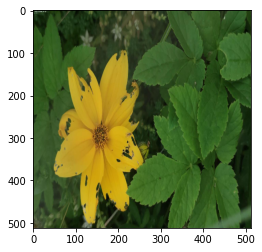

(512, 512, 1)


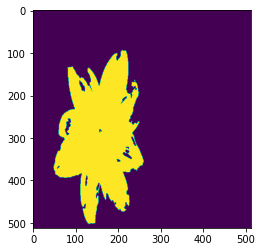

[0 1]
(512, 512, 3)


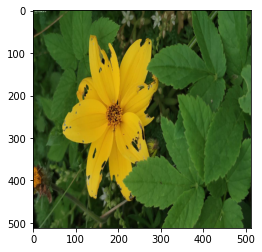

(512, 512, 1)


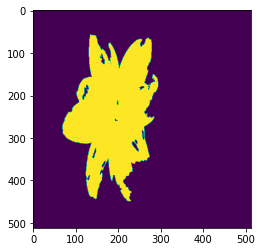

[0 1]
(512, 512, 3)


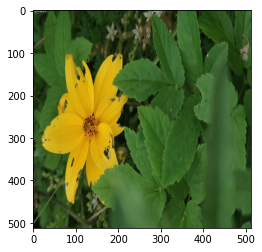

(512, 512, 1)


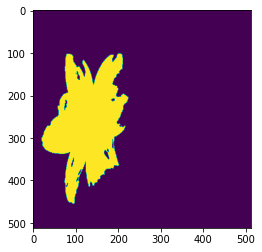

[0 1]
(512, 512, 3)


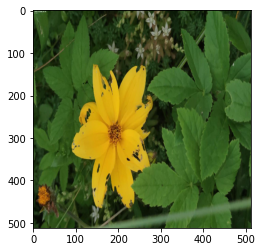

(512, 512, 1)


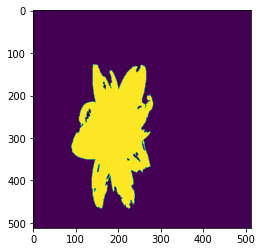

[0 1]


In [ ]:
show_img_mask_in_first_batch(ds_flowers_hub_seg_tf, batch_size)

In [ ]:
model = unet(input_shape = (512,512,3))
model.compile(optimizer=tf.keras.optimizers.Adam(1e-4),
              loss='binary_crossentropy',
              metrics=['accuracy', tf.keras.metrics.Recall(name="recall"), 
                       tf.keras.metrics.Precision(name="precision"), 
                       tf.keras.metrics.MeanIoU(num_classes=2, name='iou')])

In [ ]:
model.fit(ds_flowers_hub_seg_tf, epochs=1)

636/636 [==============================] - 403s 513ms/step - loss: 0.0179 - accuracy: 0.9936 - recall: 0.9796 - precision: 0.9778 - iou: 0.4255
